<a href="https://colab.research.google.com/github/blueeagle100/CV_projects/blob/main/SORT/sort.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SORT Algorithm

In this notebook we will implement the [SORT Algorithm](https://arxiv.org/pdf/1703.07402.pdf). 

The SORT algorithm algoirthm is a simple implementation of multi-object tracking, it stands for SIMPLE ONLINE AND REALTIME TRACKING. It essentially uses a detector to detect objects, a Kalman Filter to extrapolate objects across frames, and the Hungarian Algorithm to correlate tracks across frames


#### First we will download the necessary packages

In [ ]:
!pip install yolo5 # version 0.0.1 used at the moment of recording

In [ ]:
!pip install Pillow==7.1.2

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/drive/MyDrive/SORT/yolov5
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'
models	yolov5


In [19]:
import os
from google.colab import drive
drive.mount('/content/drive', force_remount=False)

os.chdir("/content/drive/My Drive/SORT")
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
data


In [33]:
# ensure yolov5 is in the google drive (shouldn't need to do this again)
# should this just live in a yolov5 folder on google drive?

os.chdir("/content/drive/My Drive")
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
!ls

Cloning into 'yolov5'...
remote: Enumerating objects: 12467, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 12467 (delta 7), reused 9 (delta 3), pack-reused 12447
Receiving objects: 100% (12467/12467), 12.23 MiB | 8.05 MiB/s, done.
Resolving deltas: 100% (8598/8598), done.
/content/drive/My Drive/yolov5
CONTRIBUTING.md  export.py   models	       setup.cfg       utils
data		 hubconf.py  README.md	       train.py        val.py
detect.py	 LICENSE     requirements.txt  tutorial.ipynb


In [34]:
!pwd

/content/drive/MyDrive/yolov5


In [17]:
os.chdir("/content/drive/My Drive/SORT")
!ls

data


In [3]:
import yolov5

# load model
model = yolov5.load('/content/drive/My Drive/yolov5/models/yolov5s.pt')

model.conf = 0.5
model.iou = 0.4

In [9]:
import time
import yaml
import numpy as np
import cv2

import matplotlib.pyplot as plt
%matplotlib inline

#### Get MSCOCO classes

In [10]:
fp = r'/content/drive/My Drive/yolov5/data/coco128.yaml'

with open(fp, "r") as stream:
    try:
        coco_info = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)

# get classes dictionary
classes = {i : name for i, name in enumerate(coco_info['names'])}

### Helper functions

In [11]:
def id_to_color(idx):
    """
    Random function to convert an id to a color
    (keep numbers below 255)
    """
    blue = idx*5 % 256
    green = idx*12 %256
    red = idx*23 %256
    return (red, green, blue)

def draw_boxes_v5(image_in, boxes, categories, mot_mode=False):
    image = image_in.copy()
    h, w, _ = image.shape
    for i, box in enumerate(boxes):
        label = classes[int(categories[i])]
        color = id_to_color(i*10) if mot_mode==True else (255,0,60)
        cv2.rectangle(image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), color, thickness=3)
        cv2.putText(image, str(label), (int(box[0]), int(box[1])), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=3)
    return image

def inference(img, draw_boxes=True):
    results = model(img)
    predictions = results.pred[0]
    boxes = predictions[:, :4].tolist()
    boxes_int = [[int(v) for v in box] for box in boxes]
    scores = predictions[:,4].tolist()
    categories = predictions[:,5].tolist()
    categories_int = [int(c) for c in categories]
    
    if draw_boxes:
      img_out = draw_boxes_v5(img, boxes_int, categories_int, mot_mode=False)
    else:
      img_out = img.copy()

    # change everything to arrays
    boxes_int = np.array(boxes_int)
    categories_int = np.array(categories_int)
    scores = np.array(scores)
    return img_out, boxes_int, categories_int, scores

### Get bounding boxes for video file

In [22]:
video_path = 'data/cars.mp4'
output_images = []


cap = cv2.VideoCapture(video_path)

while True:
    # get frames form video
    ret, frame = cap.read()

    if not ret:
        print('Frame not recieved, exiting...')
        break

    frame = cv2.resize(frame, (960, 540), cv2.INTER_AREA)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    img_out, boxes_int, categories_int, scores = inference(frame, draw_boxes=True)

    output_images.append(img_out)

cap.release()
cv2.destroyAllWindows()

Frame not recieved, exiting...


### Get Video of detections

In [23]:
img_out.shape

(540, 960, 3)

In [24]:
2160/4, 3840/4

(540.0, 960.0)

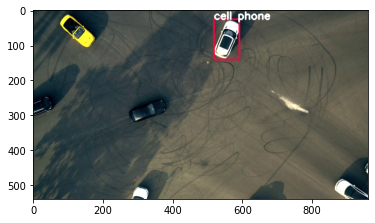

In [25]:
plt.imshow(img_out)

In [26]:
from tqdm import tqdm

detection_video = [img for img in tqdm(output_images)]

out = cv2.VideoWriter('data/car_detections.mp4',cv2.VideoWriter_fourcc(*'MP4V'), 15, (img_out.shape[1],img_out.shape[0]))

for img in detection_video:
    out.write(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
out.release()

100%|██████████| 436/436 [00:00<00:00, 310162.24it/s]


In [27]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('data/car_detections.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)